<a href="https://colab.research.google.com/github/moamenkhalaf97/code/blob/main/OCR%20thru%20scanned%20photos%20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [24]:
## extracting text from  photos photographed in bad conditions or scanned documents
import numpy as np
import cv2
import imutils
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


In [25]:
def show_img(img):
  fig=plt.gcf()
  fig.set_size_inches(20,10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

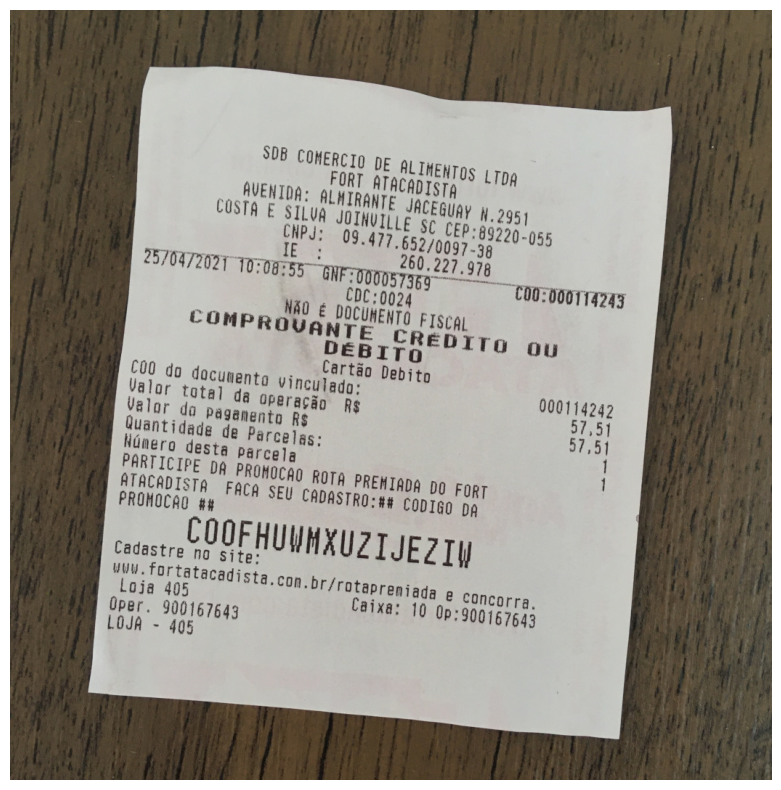

1061 1049


In [26]:
img=cv2.imread("/content/images2/doc_rotated01.jpg")
original=img.copy()
show_img(img)
(H,W)=img.shape[:2]
print(H,W)


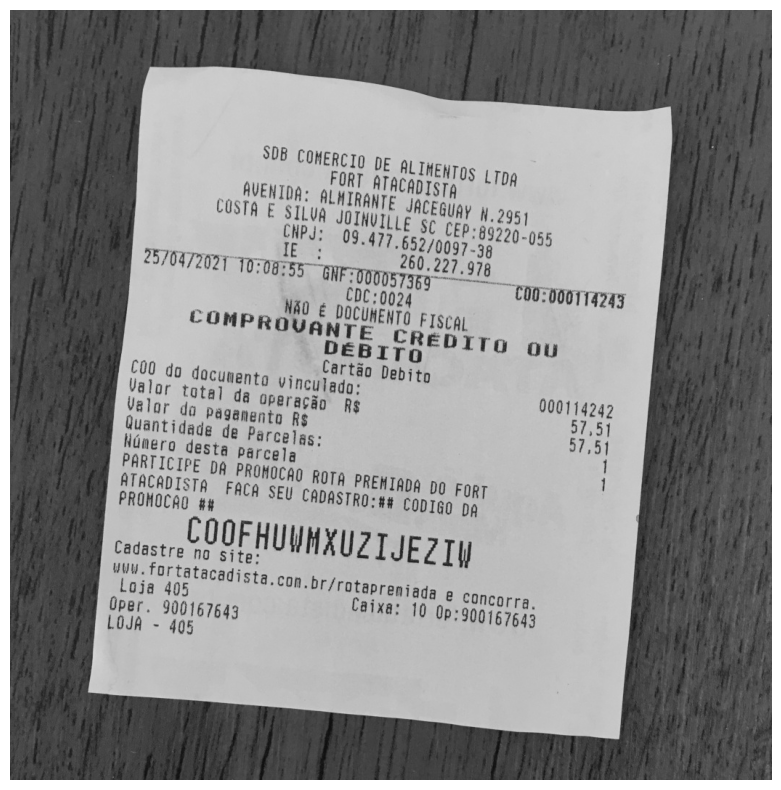

In [27]:
gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
show_img(gray)

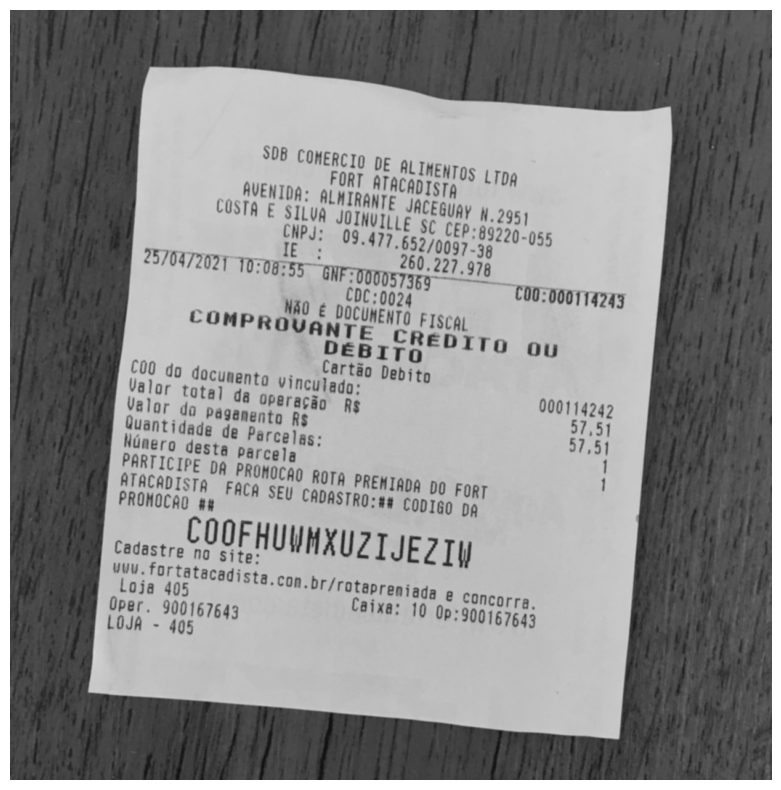

In [28]:
blur=cv2.GaussianBlur(gray, (3,3), 0)
show_img(blur)

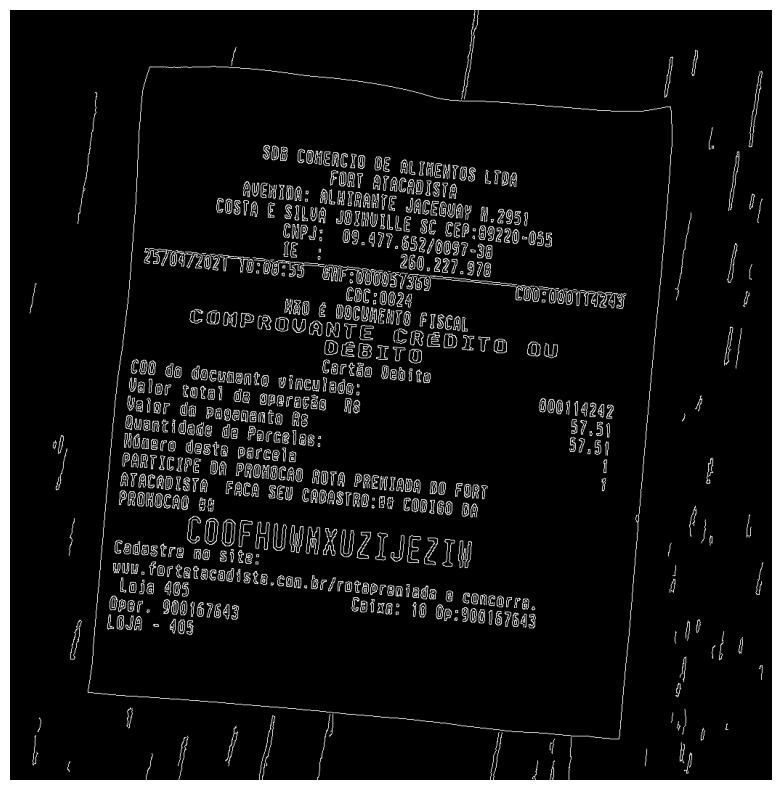

In [29]:
edged=cv2.Canny(blur, 60, 160)
show_img(edged)

In [30]:
def find_contours(img):
  conts=cv2.findContours(img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  conts=imutils.grab_contours(conts)
  conts=sorted(conts, key=cv2.contourArea, reverse=True)[:6]
  return conts

In [31]:
conts=find_contours(edged.copy())


In [32]:
conts

[array([[[277,  77]],
 
        [[276,  78]],
 
        [[250,  78]],
 
        ...,
 
        [[300,  78]],
 
        [[284,  78]],
 
        [[283,  77]]], dtype=int32),
 array([[[276,  78]],
 
        [[277,  77]],
 
        [[283,  77]],
 
        ...,
 
        [[245,  79]],
 
        [[249,  79]],
 
        [[250,  78]]], dtype=int32),
 array([[[435, 351]],
 
        [[433, 353]],
 
        [[433, 354]],
 
        [[431, 356]],
 
        [[431, 362]],
 
        [[430, 363]],
 
        [[430, 368]],
 
        [[431, 369]],
 
        [[431, 370]],
 
        [[432, 371]],
 
        [[438, 371]],
 
        [[438, 368]],
 
        [[439, 367]],
 
        [[439, 362]],
 
        [[438, 361]],
 
        [[437, 361]],
 
        [[436, 360]],
 
        [[436, 359]],
 
        [[437, 358]],
 
        [[438, 358]],
 
        [[439, 359]],
 
        [[439, 355]],
 
        [[440, 354]],
 
        [[441, 354]],
 
        [[443, 356]],
 
        [[443, 361]],
 
        [[442, 362]],
 
        

In [33]:
from re import A
for c in conts:
  perimeter=cv2.arcLength(c, True)
  approximation=cv2.approxPolyDP(c, 0.02*perimeter, True)
  if len(approximation)==4:
    larger=approximation
    break


In [34]:
larger

array([[[ 192,   78]],

       [[ 107,  940]],

       [[ 838, 1004]],

       [[ 909,  133]]], dtype=int32)

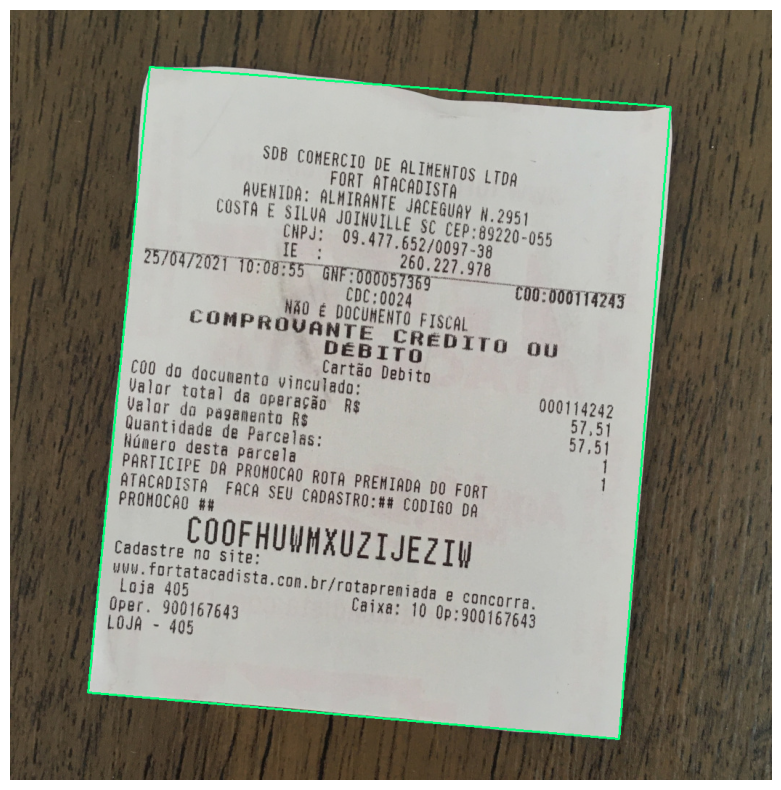

In [35]:
cv2.drawContours(img, [larger], -1, (120,255,0), 2)
show_img(img)

In [50]:
def sort_points(points):
  points=points.reshape((4,2))
  print(points.shape)
  new_points=np.zeros((4,1,2), dtype=np.int32)
  print(new_points.shape)
  print(new_points)
  add=points.sum(1)
  print(add)

  new_points[0]=points[np.argmin(add)]
  new_points[2]=points[np.argmax(add)]
  dif=np.diff(points, axis=1)
  new_points[1]=points[np.argmin(dif)]
  new_points[3]=points[np.argmax(dif)]
  print(new_points)

  return new_points

In [48]:
larger

array([[[ 192,   78]],

       [[ 107,  940]],

       [[ 838, 1004]],

       [[ 909,  133]]], dtype=int32)

In [51]:
points_larger=sort_points(larger)
print(points_larger)

(4, 2)
(4, 1, 2)
[[[0 0]]

 [[0 0]]

 [[0 0]]

 [[0 0]]]
[ 270 1047 1842 1042]
[[[ 192   78]]

 [[ 909  133]]

 [[ 838 1004]]

 [[ 107  940]]]
[[[ 192   78]]

 [[ 909  133]]

 [[ 838 1004]]

 [[ 107  940]]]


In [55]:
pts1=np.float32(points_larger)
pts1

array([[[ 192.,   78.]],

       [[ 909.,  133.]],

       [[ 838., 1004.]],

       [[ 107.,  940.]]], dtype=float32)

In [56]:
print(H,W)

1061 1049


In [57]:
pts2=np.float32( [[0,0], [W,0], [W,H], [0,H]])
print(pts2)

[[   0.    0.]
 [1049.    0.]
 [1049. 1061.]
 [   0. 1061.]]


In [59]:
matrix=cv2.getPerspectiveTransform(pts1, pts2)
print(matrix)

[[ 1.47086451e+00  1.45038844e-01 -2.93719016e+02]
 [-9.60022567e-02  1.25152033e+00 -7.91861523e+01]
 [ 1.06157588e-05  2.48315917e-05  1.00000000e+00]]


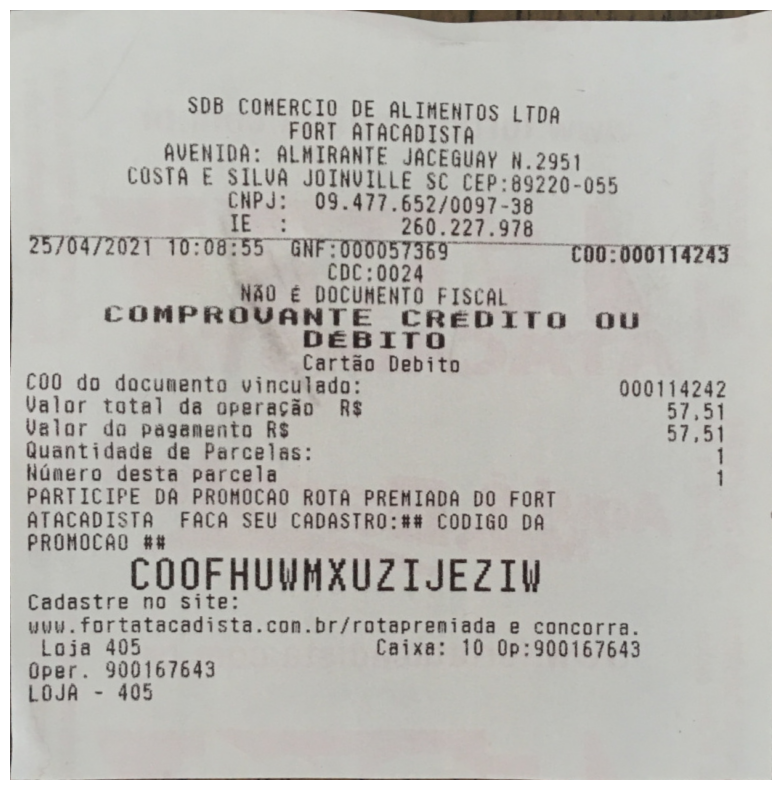

In [60]:
transform=cv2.warpPerspective(original, matrix, (W,H))
show_img(transform)

In [61]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 0s (14.4 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debco

In [62]:
import pytesseract

In [63]:
!mkdir tessdata
!wget -O ./tessdata/por.traineddata https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true

--2024-06-30 14:07:44--  https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/tesseract-ocr/tessdata/raw/main/por.traineddata [following]
--2024-06-30 14:07:44--  https://github.com/tesseract-ocr/tessdata/raw/main/por.traineddata
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/tesseract-ocr/tessdata/main/por.traineddata [following]
--2024-06-30 14:07:44--  https://raw.githubusercontent.com/tesseract-ocr/tessdata/main/por.traineddata
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awa

In [64]:
config_tesseract = "--tessdata-dir tessdata"

In [65]:
text = pytesseract.image_to_string(transform, lang='por', config=config_tesseract)
print(text)

SDB COMERCIO DE ALIMENTOS LTDA
FORT ATACADISTA
AVENIDA: ALMIRANTE JACEGUAY N.2951
COSTA E SILVA JOINVILLE SC CEP:89220-055
CNPJ: 09.477.652/0097-38
" qm 260.227.978

2570972027 TO:08:55 GRFEDU Dcug'ºnmu | TO0 000114243

NÃO É DOCUMENTO FISCAL

COMPROUVANTE CRÉDITO OU

DÉBITO

Cartão Debito
C0OO do documento vinculado: 000114242
Valor total da operação R$ REA
Valor do pagamento R$ TS
Quantidade de Parcelas: 1
Núnmero desta parcela 1

PARTICIFE DA PROMOCAO ROTA PREMIADA DO FORT
ATACADISTA FACA SEU CADASTRO:8% CODIGO DA
PROMOCÃAO &

COOFHUWMXUZIJEZIV

Cadastre no site:

— uuw.fortatacadista.con.br/rotaprenmniada e concorra.
Loja 405 Caixa: 10 0p:900167643
Oper. 900167643

LOJA - 405



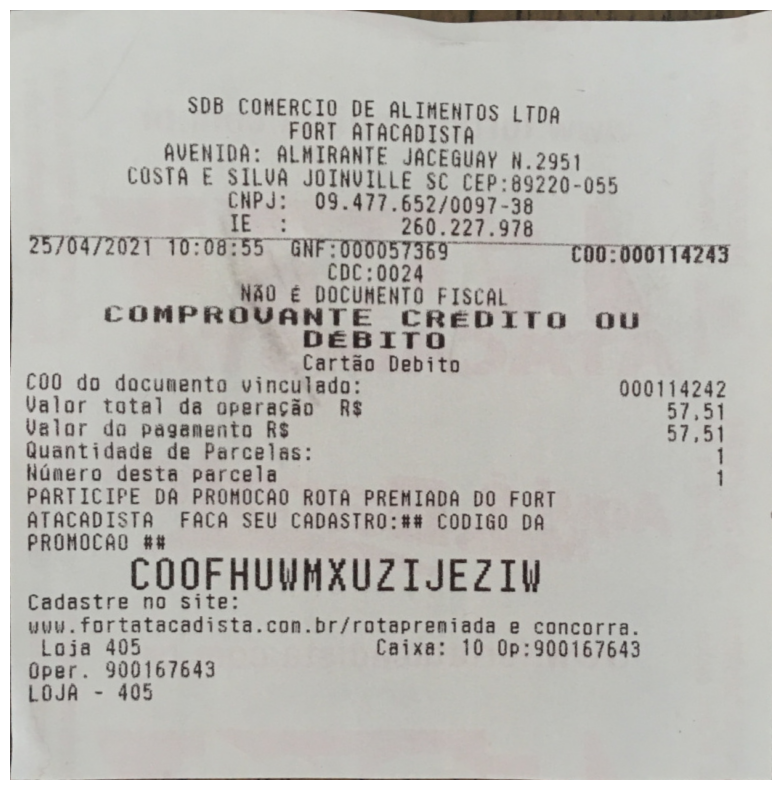

In [66]:
show_img(transform)

In [67]:
transform.shape

(1061, 1049, 3)

In [68]:
brightness=50
contrast=80
adjust=np.int16(transform)
adjust.shape

(1061, 1049, 3)

In [69]:
adjust=adjust*(contrast/127+1)-contrast+brightness
adjust=np.clip(adjust, 0, 255)
adjust=adjust.astype(np.uint8)
show_img(adjust)

array([[[160.7007874 , 170.48031496, 181.88976378],
        [196.55905512, 206.33858268, 214.48818898],
        [209.5984252 , 219.37795276, 224.26771654],
        ...,
        [221.00787402, 232.41732283, 240.56692913],
        [238.93700787, 251.97637795, 261.75590551],
        [229.15748031, 242.19685039, 255.23622047]],

       [[203.07874016, 211.22834646, 221.00787402],
        [256.86614173, 265.01574803, 271.53543307],
        [284.57480315, 292.72440945, 295.98425197],
        ...,
        [274.79527559, 282.94488189, 287.83464567],
        [279.68503937, 289.46456693, 295.98425197],
        [266.64566929, 279.68503937, 286.20472441]],

       [[235.67716535, 243.82677165, 248.71653543],
        [276.42519685, 284.57480315, 284.57480315],
        [287.83464567, 295.98425197, 295.98425197],
        ...,
        [291.09448819, 300.87401575, 300.87401575],
        [292.72440945, 304.13385827, 305.76377953],
        [281.31496063, 294.35433071, 297.61417323]],

       ...,

      

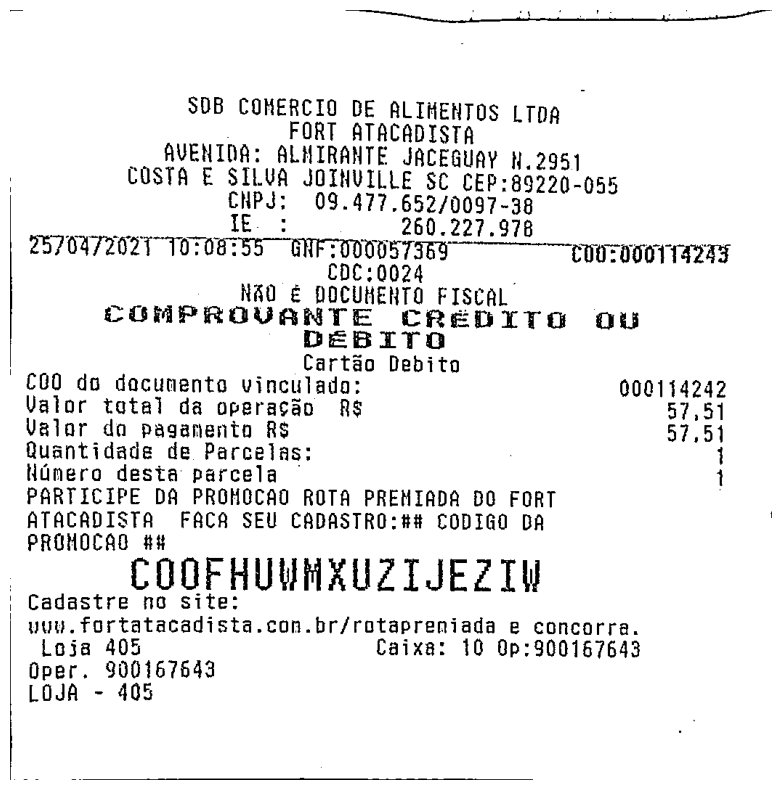

In [70]:
processed_img=cv2.cvtColor(transform, cv2.COLOR_BGR2GRAY)
processed_img=cv2.adaptiveThreshold(processed_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
show_img(processed_img)


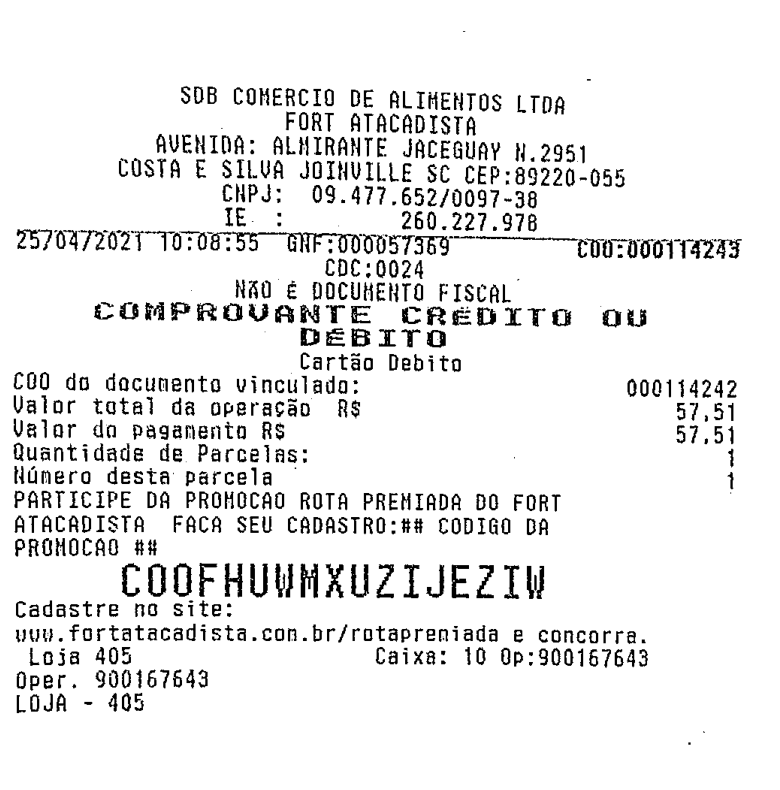

In [71]:
margin=18
img_edges=processed_img[margin:H-margin, margin:W-margin]
show_img(img_edges)

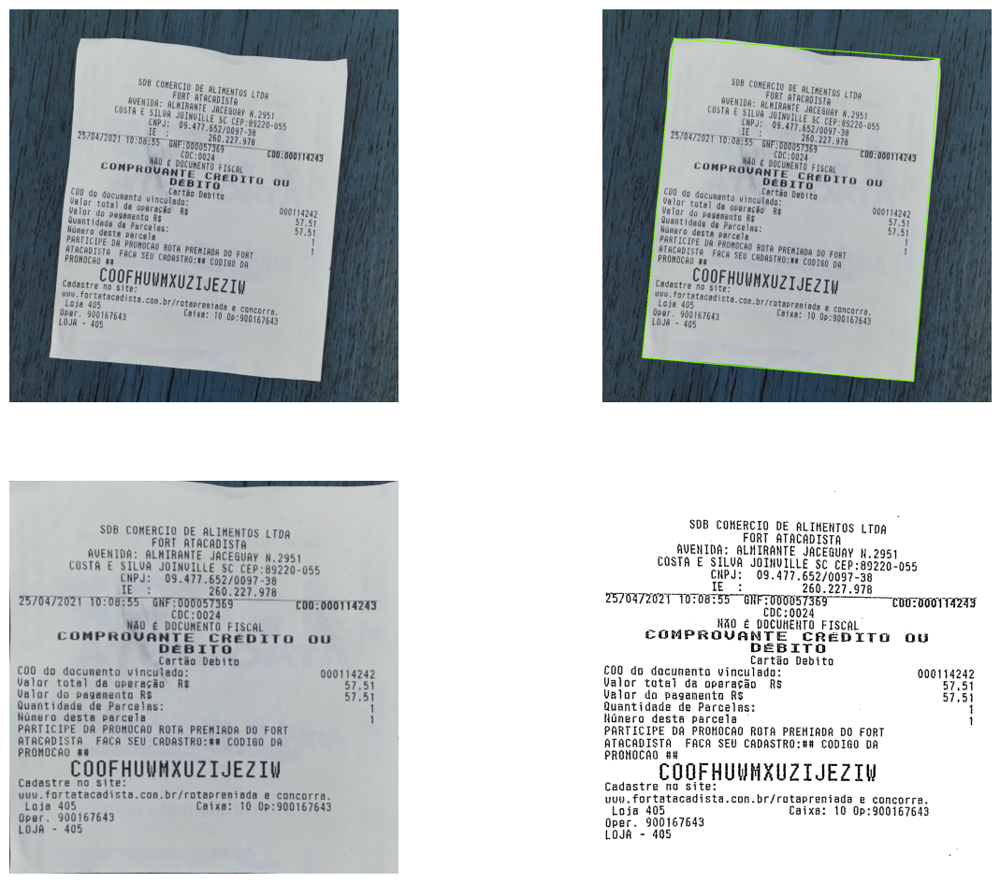

In [72]:
fig,im=plt.subplots(2,2,figsize=(15,12))
for x in range(2):
  for y in range(2):
    im[x][y].axis('off')
im[0][0].imshow(original)
im[0][1].imshow(img)
im[1][0].imshow(transform,cmap='gray')
im[1][1].imshow(img_edges,cmap='gray')

In [73]:
def transform_image(image_file):
  img = cv2.imread(image_file)
  original = img.copy()
  show_img(img)
  (H, W) = img.shape[:2]

  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (7, 7), 0)
  edged = cv2.Canny(blur, 60, 160)
  show_img(edged)
  conts = find_contours(edged.copy())
  for c in conts:
    peri = cv2.arcLength(c, True)
    aprox = cv2.approxPolyDP(c, 0.02 * peri, True)

    if len(aprox) == 4:
      larger = aprox
      break

  cv2.drawContours(img, larger, -1, (120, 255, 0), 28)
  cv2.drawContours(img, [larger], -1, (120, 255, 0), 2)
  show_img(img)

  points_larger = sort_points(larger)
  pts1 = np.float32(points_larger)
  pts2 = np.float32([[0, 0], [W, 0], [W, H], [0, H]])

  matrix = cv2.getPerspectiveTransform(pts1, pts2)
  transform = cv2.warpPerspective(original, matrix, (W, H))

  show_img(transform)
  return transform

In [74]:
def process_img(img):
  processed_img = cv2.resize(img, None, fx=1.6, fy=1.6, interpolation=cv2.INTER_CUBIC)
  processed_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  processed_img = cv2.adaptiveThreshold(processed_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
  return processed_img

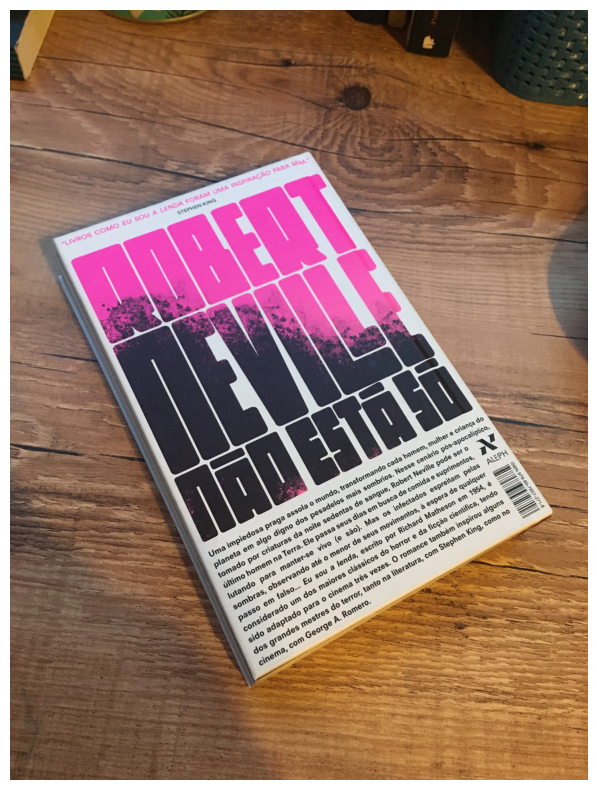

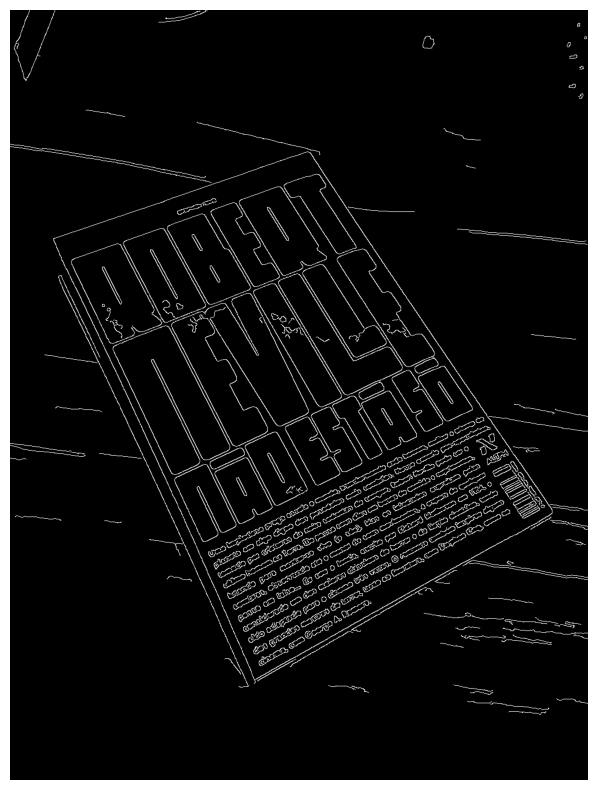

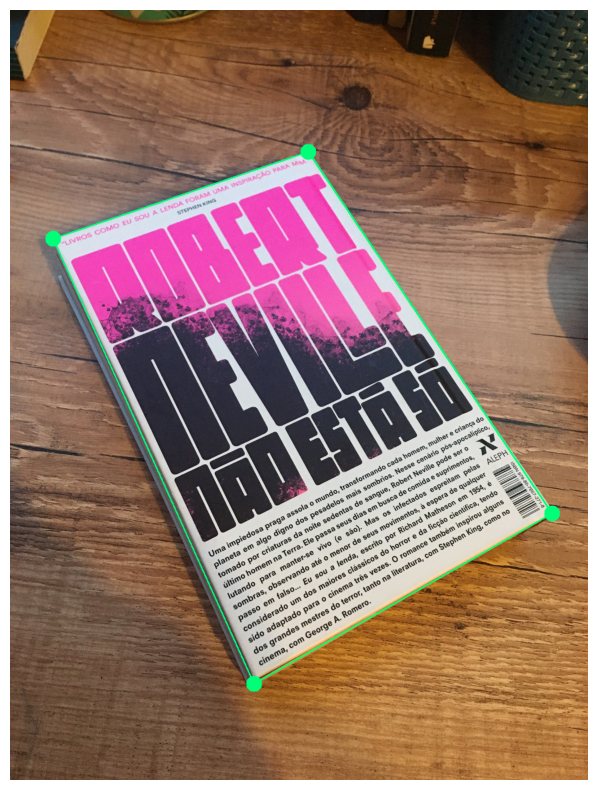

(4, 2)
(4, 1, 2)
[[[0 0]]

 [[0 0]]

 [[0 0]]

 [[0 0]]]
[ 779  481 1626 1852]
[[[  76  405]]

 [[ 528  251]]

 [[ 960  892]]

 [[ 432 1194]]]


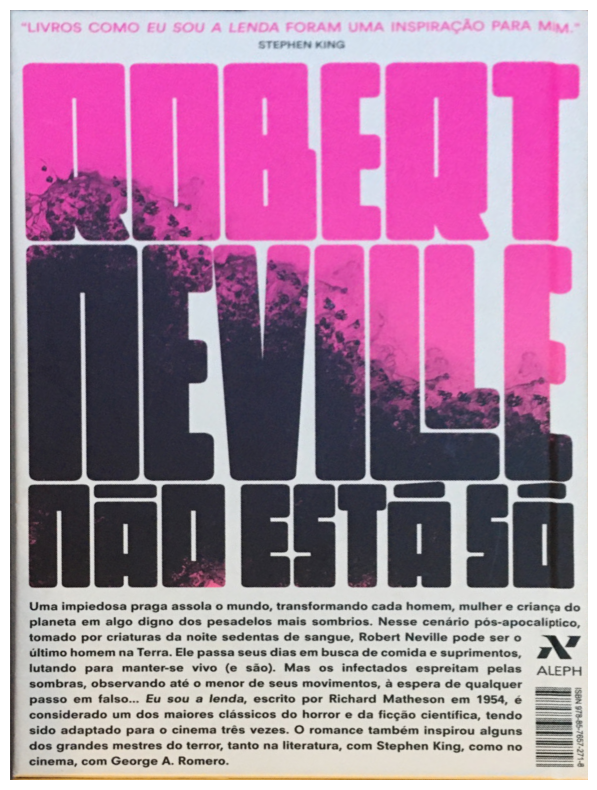

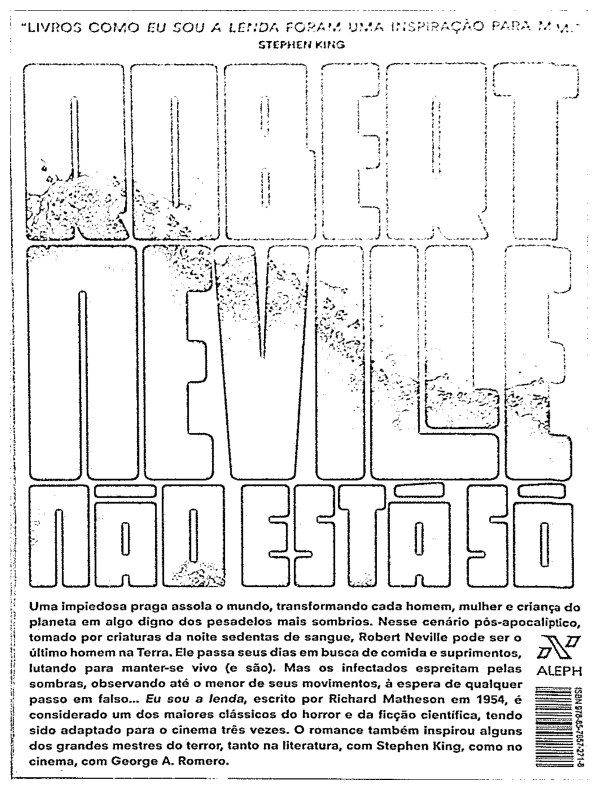

In [77]:
##applying it on the picture of book cover
img = transform_image('/content/images2/book1.jpg')
img = process_img(img)
show_img(img)